<a href="https://colab.research.google.com/github/jvataidee/DataScience/blob/master/Analise_aparicoes_de_UFO_World_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<p align="center"><img src="https://static.wixstatic.com/media/bdd7cb_6ecb6c85550043f090237e5943d2647c~mv2.png/v1/fill/w_417,h_88,al_c,q_85,usm_0.66_1.00_0.01/Ativo%2023-8.webp" height="75px"></p>

**by: [João Ataíde](https://www.joaoataide.com)**
#Análises de casos de UFOs (Parte 1)


---

<p align="center"><img src="https://static.wixstatic.com/media/bdd7cb_ce7e8307fdad46b6acd0205cef470a72~mv2.png"></p>

Extraterrestres, visitantes, luzes no céu. O que eles querem? De onde eles vêm? Eles gostam de cuscuz com ovos? UFO ou Objetos Voadores Não Identificados (OVNIs), são descritos pelos pilotos de aviões desde a segunda guerra mundial, quando eram chamados de *foo fighters*, devido a isso inúmeros pesquisadores por todo o mundo, chamados de **Ufólogos**, analisam e divulgam os encontros, criando então uma grande comunidade forte e séria, como a [Portal Fenomenum](http://www.fenomenum.com.br/index.html), o podcast [Hangar 18](https://hangar-18.pinecast.co).

O presente projeto tem com intuito analisar os números de aparições ao redor do mundo, das suas descrições de formatos, o país e estados. Porém, os dados aqui utilizados do The National UFO Reporting Center Online Database ([NUFORC ](http://www.nuforc.org/webreports.html)). Tinham características ofuscação do seu propósito, e para mim umas das bases de dados mais mal organizados que eu já vi.

Devido a isso, retirei os mesmos dados da [UFO Reports](https://github.com/planetsig/ufo-reports/treec0915f18186e5e2227083702049a838258001a2a), este repositório teve o trabalho de filtrar e organizar todos os dados, deixando estes o "menos enviesado" possível. Adquiridos no dia 05 de junho de 2020, tal dataset contém mais de 80000 registos de avistamentos e 11 variáveis, datada desde 1949 até 2014.





#Obtenção dos Dados

In [ ]:
# importar os pacotes necessarios
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#configurações de gráficos
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [ ]:
df = 'https://raw.githubusercontent.com/jvataidee/UFO_Around_world/master/ufo_sighting_data.csv'
ufo = pd.read_csv(df)

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (5,9) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


##Dicionário de variáveis



-  `Date_time` - data e hora padronizadas da observação
-  `cidade` - localização do avistamento de OVNIs
-  `estado / província` - o estado dos EUA ou província do Canadá, aparece em branco para outros locais
-  `country` - País de avistamento de OVNIs
-  `UFO_shape` - uma formato da observação
-  `lengthofencoun__seconds` - duração da observação do OVNI
-  `description_duration _of_encounter` - descrição bruta da duração do encontro (mostra incerteza na coluna anterior)
-  `description` -  descrição em texto do encontro UFO. A coluna de aviso é uma bagunça, com alguma curadoria que pode se prestar a algum processamento de linguagem natural e análise de sentimentos
-  `date_documented` - quando foi relatado o avistamento de OVNIs
-  `latitude` e `longitude` - coordenadas dos avistamentos

Podemos verificar cada variável, representada nas 5 primeiras entradas do *dataset*.



In [ ]:
#Mostrar as 5 primeiras entradas
ufo.head()

,Date_time,city,state/province,country,UFO_shape,length_of_encounter_seconds,described_duration_of_encounter,description,date_documented,latitude,longitude
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
3,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
4,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611


#Quantos atributos (variáveis) e quantas entradas o nosso conjunto de dados possui? Quais os tipos das variáveis?

In [ ]:
#Volume de dados do DataFrame
print("Entradas:\t {}".format(ufo.shape[0]))
print("Variáceis:\t {}".format(ufo.shape[1]))

#Mostrar os tipos de dados
print()
print("Tipos de dodos:")
display(ufo.dtypes)

Entradas:	 80332
Variáceis:	 11

Tipos de dodos:


Date_time                           object
city                                object
state/province                      object
country                             object
UFO_shape                           object
length_of_encounter_seconds         object
described_duration_of_encounter     object
description                         object
date_documented                     object
latitude                            object
longitude                          float64
dtype: object

Como é possível ver, teremos que converter os tipos de dado, alguns para *DataTime* e outros para *float*.


##Converter os tipos de variáveis

In [ ]:
ufo["latitude"] = pd.to_numeric(ufo["latitude"],errors='coerce')
ufo["length_of_encounter_seconds"] = pd.to_datetime(ufo["length_of_encounter_seconds"],errors='coerce')
ufo["Date_time"] = pd.to_datetime(ufo["Date_time"],errors='coerce')
ufo["date_documented"] = pd.to_datetime(ufo["date_documented"],errors='coerce')

In [ ]:
#Mostrar os tipos de dados
print()
print("Tipos de dodos:")
display(ufo.dtypes)


Tipos de dodos:


Date_time                          datetime64[ns]
city                                       object
state/province                             object
country                                    object
UFO_shape                                  object
length_of_encounter_seconds        datetime64[ns]
described_duration_of_encounter            object
description                                object
date_documented                    datetime64[ns]
latitude                                  float64
longitude                                 float64
dtype: object

##Qual a porcentagem de valores ausentes no dataset?

A qualidade do *dataset* referi-se quantidade de valores ausente. Sendo inportante enteder logo no início da análise. Possibilitando então ver tais valores, como a variável `length_of_encounter_seconds` que possui **78,6% dos seus valroes nulos**.

In [ ]:
#Mostrar porcentagem de dados faltantes
(ufo.isnull().sum()/ufo.shape[0]).sort_values(ascending = False)

length_of_encounter_seconds        0.786125
country                            0.120375
state/province                     0.072163
UFO_shape                          0.024050
Date_time                          0.008639
description                        0.000187
latitude                           0.000012
longitude                          0.000000
date_documented                    0.000000
described_duration_of_encounter    0.000000
city                               0.000000
dtype: float64

In [ ]:
#Retirar camada length_of_encounter_seconds
ufo_copy = ufo.copy()
ufo_copy.drop("length_of_encounter_seconds", axis = 1, inplace = True)
ufo_copy.dropna(inplace=True)

In [ ]:
ufo_copy.shape

(66040, 10)

Desta forma, retiramos a varável 'length_of_encounter_seconds' do *data set*, assim como todos os valores nulos existentes das outras camadas. Com isso, ficamos então com **10 camadas e 66040 casos**.

# Qual a distribuição de casos no tempo?
Umas das ideias mais importantes saber, é se existem variações dos fenômenos UFO dentro dos períodos. Notando assim, se a sazonalidade e tendência e dentre outros atributos da série temporal.


In [ ]:
ufo_time = ufo_copy["date_documented"].value_counts()
ufo_time.head()

2009-12-12    1262
2006-10-30    1103
2010-11-21    1087
2008-10-31     985
2013-08-30     929
Name: date_documented, dtype: int64

In [ ]:
ufo_time.shape

(316,)

In [ ]:
ufo_time.describe()

count     316.000000
mean      208.987342
std       218.278895
min         1.000000
25%        74.250000
50%       127.500000
75%       254.250000
max      1262.000000
Name: date_documented, dtype: float64

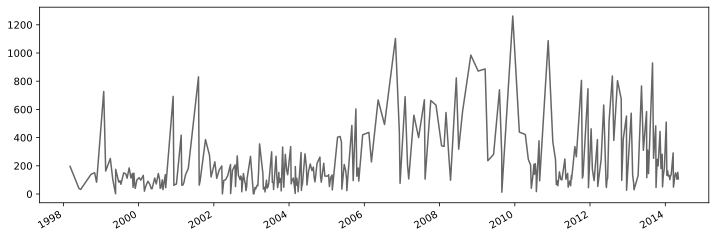

In [ ]:
ufo_time.plot(figsize=(12,4), cmap = 'Accent_r')

In [ ]:
# importar pacotes necessários
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
# salvar os componentes da *time series* na variável results para 2 dias
result = seasonal_decompose(ufo_time, freq = 2)

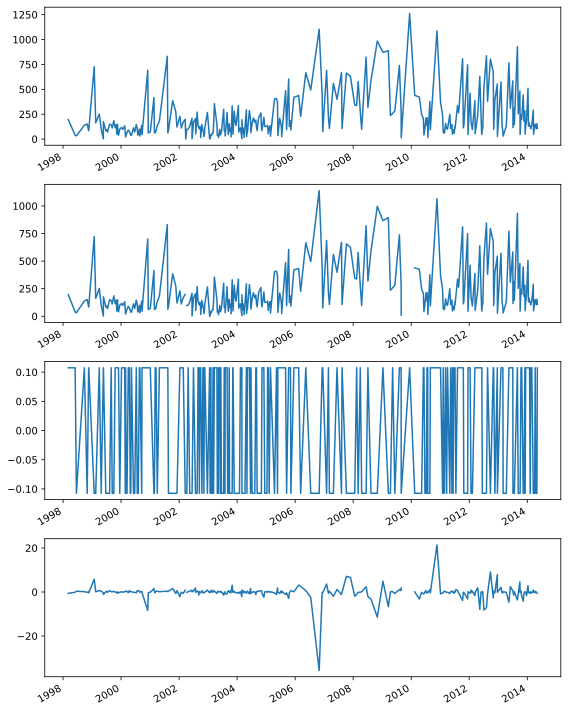

In [ ]:
fig, (ax1,ax2,ax3, ax4) = plt.subplots(4,1, figsize=(8,10))
result.observed.plot(ax=ax1)
result.trend.plot(ax=ax2)
result.seasonal.plot(ax=ax3)
result.resid.plot(ax=ax4)
plt.tight_layout();

É possível reparar nas séries temporais mostradas, que os dados, **não apresentam nenhum tipo de tendência (Segundo Gráfico), sazonalidade (Terceiro Gráfico)**, porém foi possível notar **concentrações** nos períodos de **2006** até um pouco antes de **2012**.


#Qual quais os tipos dos shapes de UFOs

Agora, vamos identificar a partir dos relatos, quais os tipos (*shapes*) de UFOs mais descritos.



In [ ]:
#Copiar dos dados de shapes
ufo_shape = ufo_copy["UFO_shape"].copy()
ufo_shape.head()

0    cylinder
3      circle
4       light
5      sphere
7        disk
Name: UFO_shape, dtype: object

In [ ]:
#Descrever a estatistica dos shapes
ufo_shape.value_counts().describe()

count       28.000000
mean      2358.571429
std       3134.981345
min          1.000000
25%        147.250000
50%       1087.500000
75%       4328.500000
max      14062.000000
Name: UFO_shape, dtype: float64

In [ ]:
from matplotlib.colors import ListedColormap
from wordcloud import WordCloud

#definição das cores
color_map = ListedColormap(['#21e6c1', '#278ea5','#1f4287', '#071e3d'])
cloud = WordCloud(background_color = 'white', max_words = 150, colormap = color_map, height= 400,width = 500)

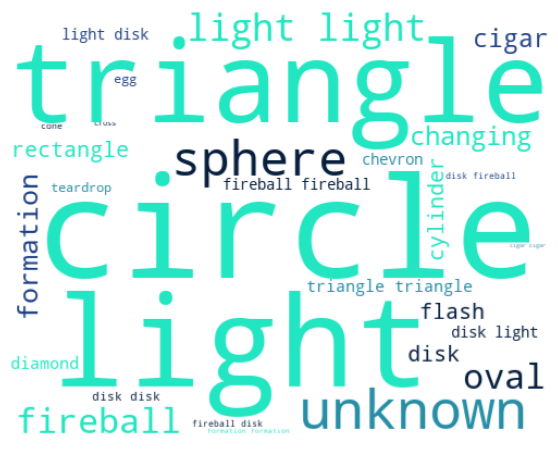

In [ ]:
cloud = cloud.generate(ufo_shape.str.cat(sep=' '))
plt.figure(figsize=(15,8))
plt.imshow(cloud)
plt.axis('off')
plt.show()

Existem **28 descrições** diferentes para as aparições, tendo descrições que chegam a **14062**, e uma média de **2358.57**. Como podemos ver, **palavras como Circle, Light e Triangle**, são as que mais de **destacam.**

#Qual a localização dos UFOs ao redor do mundo?

In [ ]:
ufo_pais = ufo_copy.copy()
ufo_pais.drop(['Date_time','city','state/province','date_documented','described_duration_of_encounter','description'],axis = 1, inplace = True)

In [ ]:
ufo_pais.head()

,country,UFO_shape,latitude,longitude
0,us,cylinder,29.883056,-97.941111
3,us,circle,28.978333,-96.645833
4,us,light,21.418056,-157.803611
5,us,sphere,36.595000,-82.188889
7,us,disk,41.117500,-73.408333


In [ ]:
#Descrever as estatisticas 
ufo_pais2 = ufo_pais.country.value_counts()
ufo_pais2

us    63099
ca     2921
gb       10
au       10
Name: country, dtype: int64

In [ ]:
# Mapa das localidade dos UFOs
ufo_pais.plot (kind="scatter", x='longitude', y='latitude', alpha=0.4, s=8,
              cmap=plt.get_cmap('Blues'), figsize=(12,8));

Os **Estados Unidos possuem 63099 e o Canadá 2921**, já as Austrália e Grã-Bretanha possuem somente **10** casos. 

Obs. Pode-se notar que estes dados, possuem somente presença neste países em questão, isto pode ser devido a NUFORC ser uma iniciativa americana.

#Conclusões

Cabe destacar que o presente projeto se trata de uma **análise exploratória** inicial, onde levantaram-se algumas hipóteses sobre as aparições de UFO ao redor do mundo, identificando que **não existem tendências, nem sazonalidades** nas aparições, a ocorrência de descrições como luzes, **círculos e triângulos se destacam**, e uma **concentração de casos, nos Estados Unidos e Canadá**. Desta forma, fica em aberto o desenvolvimento de pesquisas futuras, como:

- Qual comportamento dos shapes no tempo?
- Qual comportamento dos shapes por país?
- Existe relação com centros cômicos da região?
- Existe relação com o poder bélico da região?

Além de que, neste presente momento estou em contato com ufólogos nacionais, para obter dados mais "interessantes", com qual possamos direcionar a pesquisa para as regiões do Brasil.